In [3]:
from typing import Any
from torchmetrics.functional.image.lpips import learned_perceptual_image_patch_similarity
from torchmetrics.functional.image import structural_similarity_index_measure
from torchmetrics.image import PeakSignalNoiseRatio

class ReconstructionEval:
    def __init__(self, lpips_net_type="alex", device="cuda"):
        self.lpips_net_type = lpips_net_type
        self.psnr = PeakSignalNoiseRatio().to(device)

    def __call__(self, samples, original, calc_fid: bool=False) -> Any:
        lpips = learned_perceptual_image_patch_similarity(samples, original, net_type="vgg")
        psnr_score = self.psnr(samples, original)
        ssim = structural_similarity_index_measure(samples, original)

        return {
            "lpips": lpips,
            "psnr": psnr_score,
            "ssim": ssim,
        }

/home/pg51242/Desktop/text2img-gen/text2img_dm/lib64/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
import torch
from diffusers import StableDiffusionPipeline
from consistencydecoder import ConsistencyDecoder, save_image, load_image

# encode with stable diffusion vae
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, device="cuda:0"
)
pipe.vae.cuda()
decoder_consistency = ConsistencyDecoder(device="cuda:0") # Model size: 2.49 GB

In [56]:
def trans(image):
    image = image[0].cpu().numpy()
    image = (image + 1.0) * 127.5
    image = image.clip(0, 255).astype(np.uint8)
    image = Image.fromarray(image.transpose(1, 2, 0))

    return image

In [77]:
import locale
print(locale.getpreferredencoding())

import locale
def getpreferredencoding(do_setlocale = True):
 return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

ANSI_X3.4-1968


In [78]:
! pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 12.3 MB/s eta 0:00:00


In [81]:
! pip install torch-fidelity

In [68]:
torch.cuda.empty_cache()

# Compare reconstructions across different resolutions

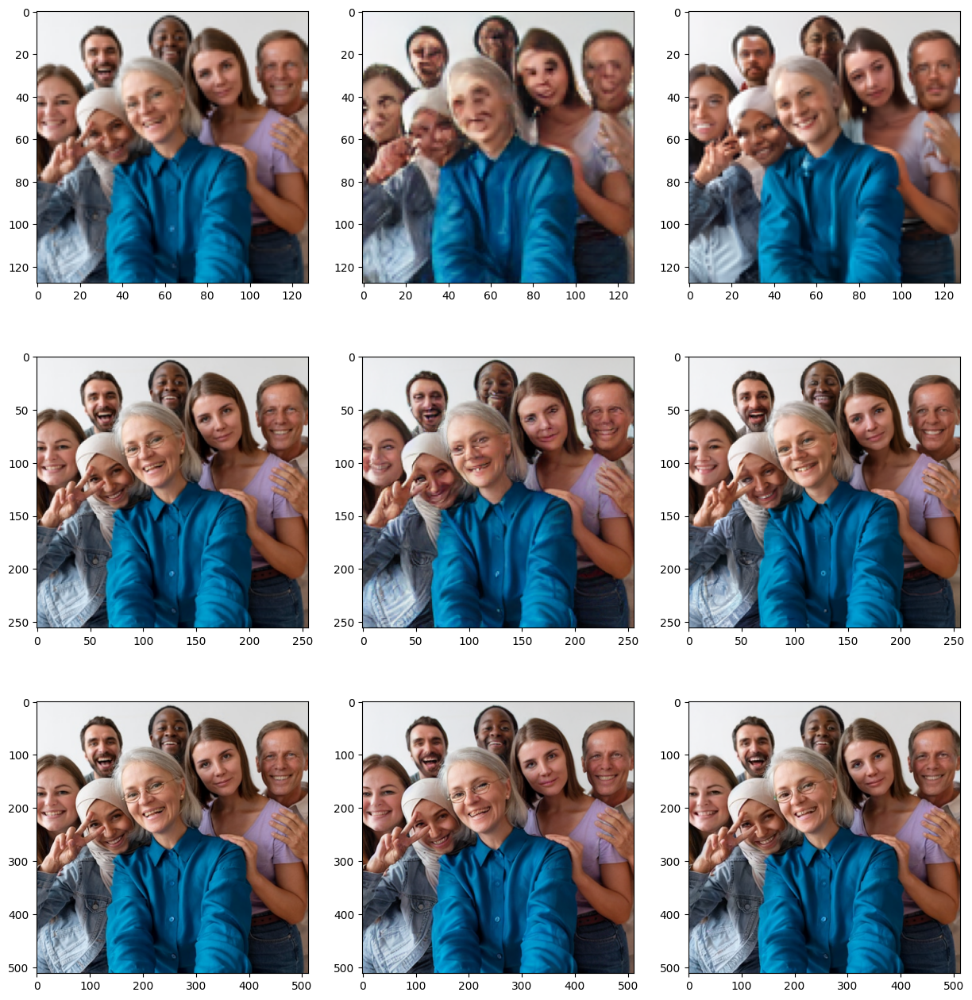

In [89]:
resolutions = [128, 256, 512]

fig = plt.figure(figsize = (15,16))

diffs_gan = []
diffs_cons = []
recons = ReconstructionEval()
for i in range(len(resolutions)):
    res = resolutions[i]
    image = load_image("people.jpg", size=(res, res), center_crop=True)
    latent = pipe.vae.encode(image.half().cuda()).latent_dist.mean
    # decode with gan
    sample_gan = pipe.vae.decode(latent).sample.detach()

    # decode with vae
    sample_consistency = decoder_consistency(latent)

    diffs_gan.append(recons(sample_gan.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))
    diffs_cons.append(recons(sample_consistency.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))

    ax1 = fig.add_subplot(len(resolutions), 3, (i*3) + 1)
    plt.imshow(trans(image))
    ax2 = fig.add_subplot(len(resolutions), 3, (i*3) + 2)
    plt.imshow(trans(sample_gan))
    ax3 = fig.add_subplot(len(resolutions), 3, (i*3) + 3)
    plt.imshow(trans(sample_consistency))

    del image, sample_gan, sample_consistency, latent

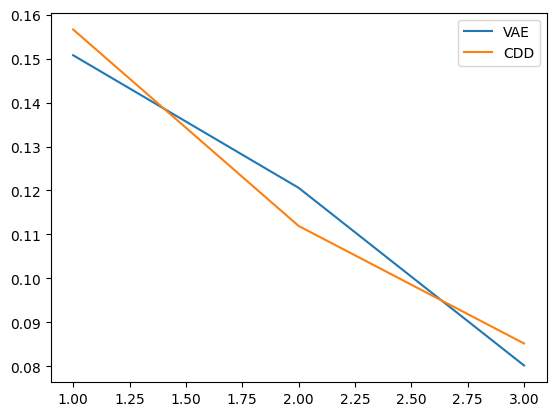

In [99]:
# LPIPS
lpips_gan = [e['lpips'].cpu() for e in diffs_gan]
lpips_cons = [e['lpips'].cpu() for e in diffs_cons]
plt.plot([1, 2, 3], lpips_gan, label = "VAE")
plt.plot([1, 2, 3], lpips_cons, label = "CDD")
plt.legend()
plt.show()

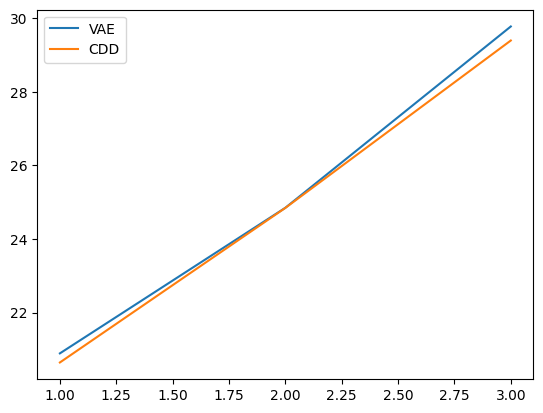

In [100]:
psnr_gan = [e['psnr'].cpu() for e in diffs_gan]
psnr_cons = [e['psnr'].cpu() for e in diffs_cons]
plt.plot([1, 2, 3], psnr_gan, label = "VAE")
plt.plot([1, 2, 3], psnr_cons, label = "CDD")
plt.legend()
plt.show()

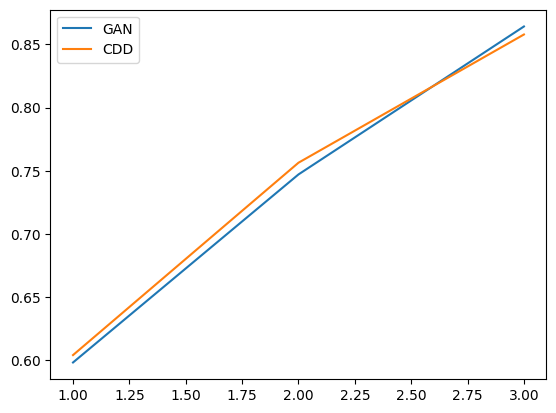

In [101]:
ssim_gan = [e['ssim'].cpu() for e in diffs_gan]
ssim_cons = [e['ssim'].cpu() for e in diffs_cons]
plt.plot([1, 2, 3], ssim_gan, label = "GAN")
plt.plot([1, 2, 3], ssim_cons, label = "CDD")
plt.legend()
plt.show()

# Evaluation of the level of detail the latent space stores


## Apply Gaussian Blur to the latents

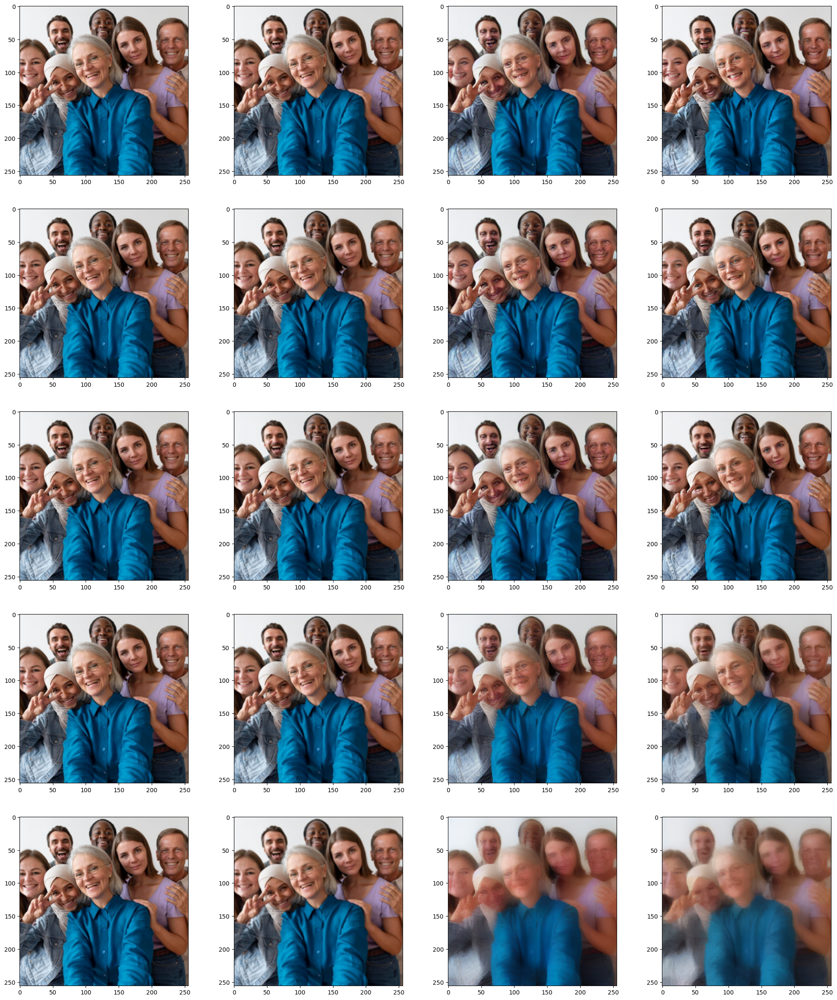

In [156]:
import torchvision
import torchvision.transforms as T

blurs = [0.1, 0.2, 0.3, 0.4, 0.5]

fig = plt.figure(figsize = (25,30))

diffs_gan = []
diffs_cons = []
recons = ReconstructionEval()
for i in range(len(blurs)):
    image = load_image("people.jpg", size=(256, 256), center_crop=True)
    latent = pipe.vae.encode(image.half().cuda()).latent_dist.mean

    blur = T.GaussianBlur(kernel_size=(3,3), sigma=blurs[i])
    latent = blur(latent)

    # decode with gan
    sample_gan = pipe.vae.decode(latent).sample.detach()

    # decode with vae
    sample_consistency = decoder_consistency(latent)

    diffs_gan.append(recons(sample_gan.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))
    diffs_cons.append(recons(sample_consistency.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))

    ax1 = fig.add_subplot(len(blurs), 4, (i*4) + 1)
    plt.imshow(trans(image))
    ax2 = fig.add_subplot(len(blurs), 4, (i*4) + 2)
    plt.imshow(trans(blur(image)))
    ax3 = fig.add_subplot(len(blurs), 4, (i*4) + 3)
    plt.imshow(trans(sample_gan))
    ax4 = fig.add_subplot(len(blurs), 4, (i*4) + 4)
    plt.imshow(trans(sample_consistency))


tensor(0., device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(-1.1921e-07, device='cuda:0', dtype=torch.float16,
       grad_fn=<MeanBackward0>)
tensor(-2.5094e-05, device='cuda:0', dtype=torch.float16,
       grad_fn=<MeanBackward0>)


tensor(-0.0003, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(-0.0010, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)


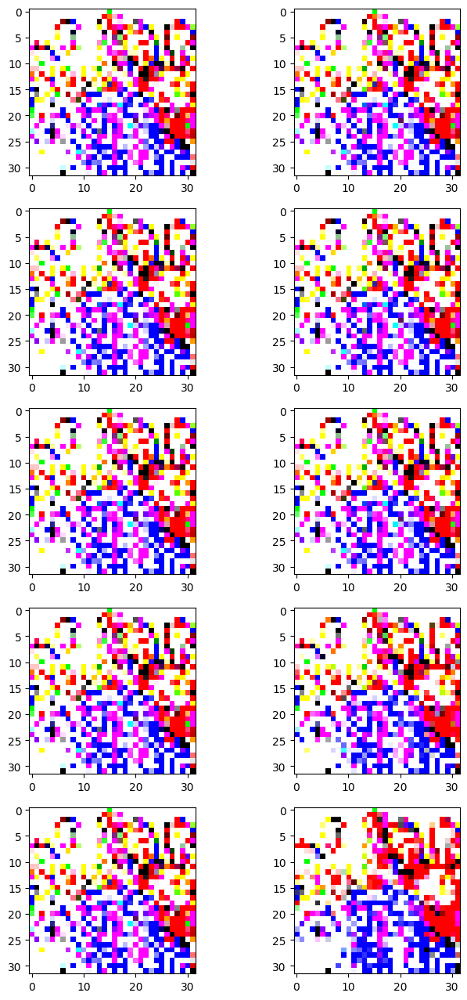

In [157]:
import torchvision
import torchvision.transforms as T

blurs = [0.1, 0.2, 0.3, 0.4, 0.5]

fig = plt.figure(figsize = (8,16))

diffs_gan = []
diffs_cons = []
recons = ReconstructionEval()
for i in range(len(blurs)):
    image = load_image("people.jpg", size=(256, 256), center_crop=True)
    latent = pipe.vae.encode(image.half().cuda()).latent_dist.mean[0]

    blur = T.GaussianBlur(kernel_size=(3,3), sigma=blurs[i])
    ax1 = fig.add_subplot(len(blurs), 2, (i*2) + 1)
    plt.imshow(latent.float().permute(1, 2, 0).cpu().detach().numpy())
    ax2 = fig.add_subplot(len(blurs), 2, (i*2) + 2)
    plt.imshow(blur(latent).float().permute(1, 2, 0).cpu().detach())

    print((latent-blur(latent)).mean())


## Apply Gaussian Noise to the latents

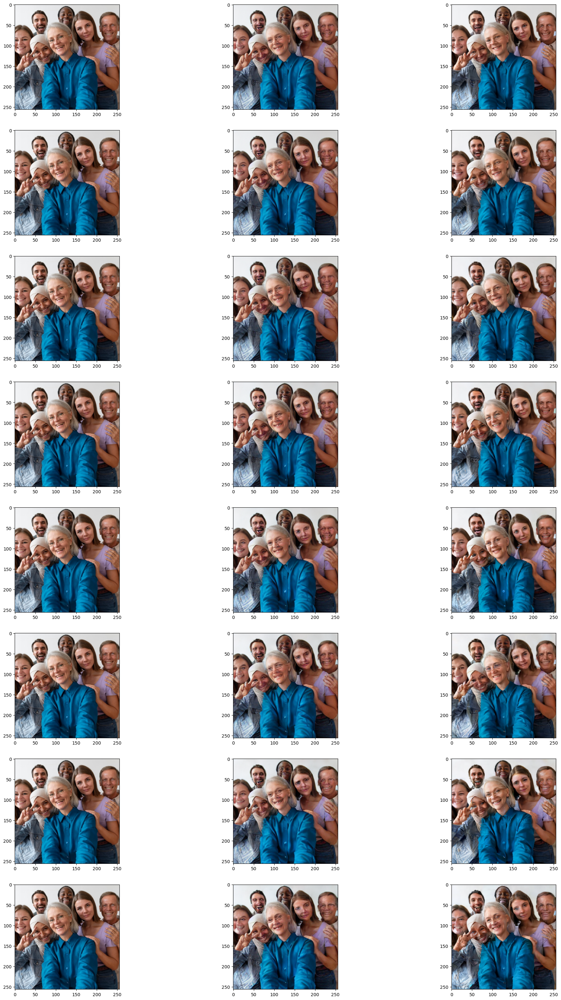

In [170]:
import torchvision
import torchvision.transforms as T

noise_lvls = [0.0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

fig = plt.figure(figsize = (25,40))

diffs_gan = []
diffs_cons = []
recons = ReconstructionEval()
for i in range(len(noise_lvls)):
    image = load_image("people.jpg", size=(256, 256), center_crop=True)
    latent = pipe.vae.encode(image.half().cuda()).latent_dist.mean

    latent = latent + (noise_lvls[i]**0.5)*torch.randn(latent.shape).cuda().half()

    # decode with gan
    sample_gan = pipe.vae.decode(latent).sample.detach()

    # decode with vae
    sample_consistency = decoder_consistency(latent)

    diffs_gan.append(recons(sample_gan.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))
    diffs_cons.append(recons(sample_consistency.clip(-1, 1).half(), image.clip(-1, 1).cuda().half()))

    ax1 = fig.add_subplot(len(noise_lvls), 3, (i*3) + 1)
    plt.imshow(trans(image))
    ax2 = fig.add_subplot(len(noise_lvls), 3, (i*3) + 2)
    plt.imshow(trans(sample_gan))
    ax3 = fig.add_subplot(len(noise_lvls), 3, (i*3) + 3)
    plt.imshow(trans(sample_consistency))


tensor(0., device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(0.0006, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(-0.0003, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)


tensor(-0.0145, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(0.0004, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(0.0027, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)


tensor(0.0005, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)
tensor(-0.0131, device='cuda:0', dtype=torch.float16, grad_fn=<MeanBackward0>)


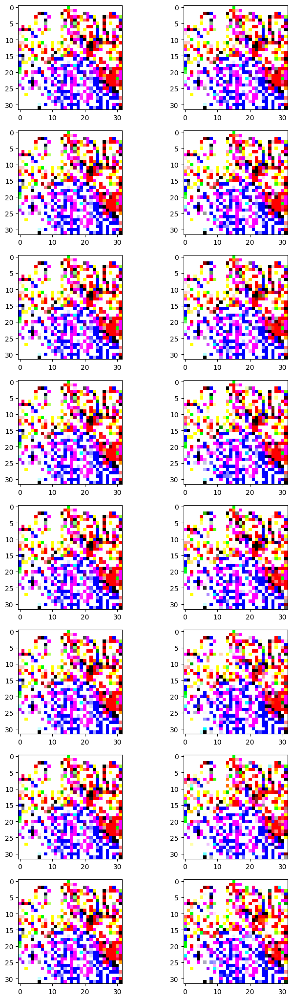

In [167]:
import torchvision
import torchvision.transforms as T

noise_lvls = [0.0, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

fig = plt.figure(figsize = (8,26))

diffs_gan = []
diffs_cons = []
recons = ReconstructionEval()
for i in range(len(noise_lvls)):
    image = load_image("people.jpg", size=(256, 256), center_crop=True)
    latent = pipe.vae.encode(image.half().cuda()).latent_dist.mean[0]

    latent_noised = latent + (noise_lvls[i]**0.5)*torch.randn(latent.shape).cuda().half()

    ax1 = fig.add_subplot(len(noise_lvls), 2, (i*2) + 1)
    plt.imshow(latent.float().permute(1, 2, 0).cpu().detach().numpy())
    ax2 = fig.add_subplot(len(noise_lvls), 2, (i*2) + 2)
    plt.imshow(latent_noised.float().permute(1, 2, 0).cpu().detach())

    print((latent-latent_noised).mean())


In [172]:
diffs_gan

[{'lpips': tensor(0.1206, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(24.8472, device='cuda:0'),
  'ssim': tensor(0.7471, device='cuda:0', dtype=torch.float16)},
 {'lpips': tensor(0.1218, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(24.7969, device='cuda:0'),
  'ssim': tensor(0.7441, device='cuda:0', dtype=torch.float16)},
 {'lpips': tensor(0.1265, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(24.6077, device='cuda:0'),
  'ssim': tensor(0.7344, device='cuda:0', dtype=torch.float16)},
 {'lpips': tensor(0.1304, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(24.3237, device='cuda:0'),
  'ssim': tensor(0.7266, device='cuda:0', dtype=torch.float16)},
 {'lpips': tensor(0.1411, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(24.0012, device='cuda:0'),
  'ssim': tensor(0.7075, device='cuda:0', dtype=torch.float16)},
 {'lpips': tensor(0.1472, device='cuda:0', dtype=torch.float16),
  'psnr': tensor(23.6265, device='cuda:0'),
  'ssim': tensor(0.68

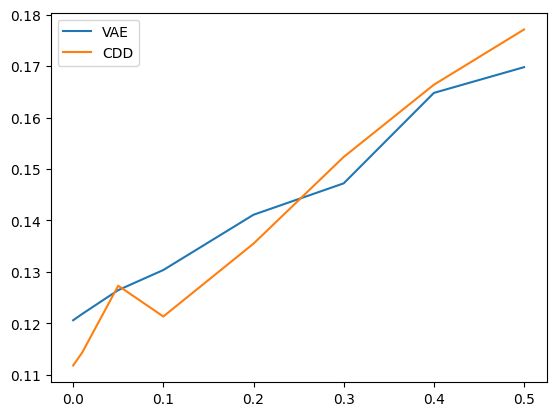

In [179]:
# LPIPS
lpips_gan = [e['lpips'].cpu() for e in diffs_gan]
lpips_cons = [e['lpips'].cpu() for e in diffs_cons]
plt.plot(noise_lvls, lpips_gan, label = "VAE")
plt.plot(noise_lvls, lpips_cons, label = "CDD")
plt.legend()
plt.show()

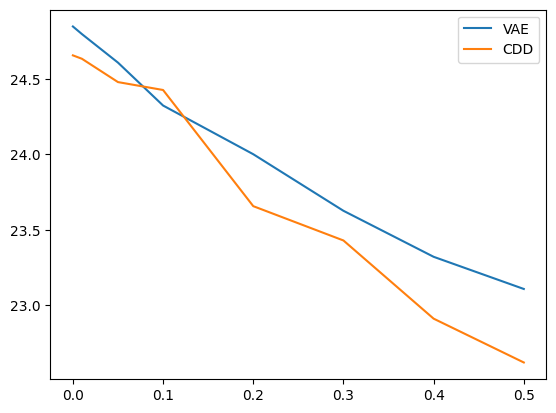

In [178]:
# PSNR
psnr_gan = [e['psnr'].cpu() for e in diffs_gan]
psnr_cons = [e['psnr'].cpu() for e in diffs_cons]
plt.plot(noise_lvls, psnr_gan, label = "VAE")
plt.plot(noise_lvls, psnr_cons, label = "CDD")
plt.legend()
plt.show()

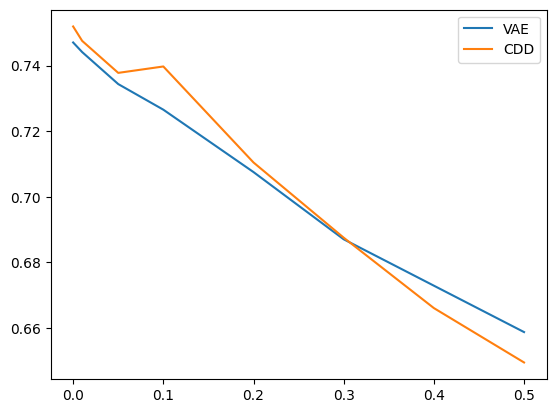

In [180]:
# SSIM
ssim_gan = [e['ssim'].cpu() for e in diffs_gan]
ssim_cons = [e['ssim'].cpu() for e in diffs_cons]
plt.plot(noise_lvls, ssim_gan, label = "VAE")
plt.plot(noise_lvls, ssim_cons, label = "CDD")
plt.legend()
plt.show()